# 🚀 **Kickstarter Campaigns 2009 - 2017: <br /> Understanding & Predicting Success**
============================================================ <br />
Jessica Gunther
## 📊 Dataset
* Kaggle: https://www.kaggle.com/kemical/kickstarter-projects?select=ks-projects-201801.csv
* 370K + kickstarter campaign records over eight years

## ✅ Outline of Analysis:
* **Phase 1: Preprocessing**
    * Understanding of dataframe, attributes and missing values
    * Creation of new attributes where necessary and/or beneficial to analysis
    * Review of summary statistics
* **Phase 2: Visualization**
    * Understanding attribute relationships, distributions and occurrences using matplotlib
    * Look at correlations
* **Phase 3: Association Rule Mining**
    * Identifying strong associations in the dataset using Apriori 
    * Further supporting previous visualization section
* **Phase 4: Classification Model**
    * Build classification model using sklearn
* **Phase 5: Predicting New Campaign Instances**
    * Allows user to input new campaign info
    * Using classification model, program will tell user the predicted outcome of the campaign
* **Phase 6: Discussion**
    * Analysis applications and possible future work

## Phase 1: Preprocessing

In [30]:
#load data into pandas dataframe

import csv
import pandas as pd

#import data into a dataframe and view

data = pd.read_csv('kickstarter.csv')

data

,ID,name,category,main_category,currency,deadline,goal,launched,pledged,state,backers,country,usd pledged,usd_pledged_real,usd_goal_real
0,1000002330,The Songs of Adelaide & Abullah,Poetry,Publishing,GBP,2015-10-09,1000.0,2015-08-11 12:12:28,0.0,failed,0,GB,0.0,0.0,1533.95
1,1000003930,Greeting From Earth: ZGAC Arts Capsule For ET,Narrative Film,Film & Video,USD,2017-11-01,30000.0,2017-09-02 04:43:57,2421.0,failed,15,US,100.0,2421.0,30000.00
2,1000004038,Where is Hank?,Narrative Film,Film & Video,USD,2013-02-26,45000.0,2013-01-12 00:20:50,220.0,failed,3,US,220.0,220.0,45000.00
3,1000007540,ToshiCapital Rekordz Needs Help to Complete Album,Music,Music,USD,2012-04-16,5000.0,2012-03-17 03:24:11,1.0,failed,1,US,1.0,1.0,5000.00
4,1000011046,Community Film Project: The Art of Neighborhoo...,Film & Video,Film & Video,USD,2015-08-29,19500.0,2015-07-04 08:35:03,1283.0,canceled,14,US,1283.0,1283.0,19500.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
378656,999976400,ChknTruk Nationwide Charity Drive 2014 (Canceled),Documentary,Film & Video,USD,2014-10-17,50000.0,2014-09-17 02:35:30,25.0,canceled,1,US,25.0,25.0,50000.00
378657,999977640,The Tribe,Narrative Film,Film & Video,USD,2011-07-19,1500.0,2011-06-22 03:35:14,155.0,failed,5,US,155.0,155.0,1500.00
378658,999986353,Walls of Remedy- New lesbian Romantic Comedy f...,Narrative Film,Film & Video,USD,2010-08-16,15000.0,2010-07-01 19:40:30,20.0,failed,1,US,20.0,20.0,15000.00
378659,999987933,BioDefense Education Kit,Technology,Technology,USD,2016-02-13,15000.0,2016-01-13 18:13:53,200.0,failed,6,US,200.0,200.0,15000.00


### Review data types and identify columns with missing values

In [31]:
#remove ID attribute (not valuable for analysis)
data.pop('ID')

#get basic information such as number of rows, columns, data types and null values
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 378661 entries, 0 to 378660
Data columns (total 14 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   name              378657 non-null  object 
 1   category          378661 non-null  object 
 2   main_category     378661 non-null  object 
 3   currency          378661 non-null  object 
 4   deadline          378661 non-null  object 
 5   goal              378661 non-null  float64
 6   launched          378661 non-null  object 
 7   pledged           378661 non-null  float64
 8   state             378661 non-null  object 
 9   backers           378661 non-null  int64  
 10  country           378661 non-null  object 
 11  usd pledged       374864 non-null  float64
 12  usd_pledged_real  378661 non-null  float64
 13  usd_goal_real     378661 non-null  float64
dtypes: float64(5), int64(1), object(8)
memory usage: 40.4+ MB


In [32]:
#there are missing values in the name column (only 4)
#there are missing values in the usd pledged column
#the usd pledged column is the same as the usd_pledged_real column, 
#but they were converted using differnt APIs
#therefore, I'm going to delete the usd pledged column which
#is missing values

f = data.pop('usd pledged')

#since there are only 4 name values that are null and we will 
#remove the name attribute anyway before running any ML algos,
#I will leave those records for initial analysis and visualizations

### Adding attributes:
* month: month campaign started
* length: time of campaign
* year: year of campaign 
* percent_goal: % of goal reached
* avg_contribute: avg. contribution size per campaign 

In [33]:
#add start month attribute 
def getmonths(df, column):
    months = []
    for i in range(len(df)):
        date = df.loc[i, column]
        if date[5:7] == '01':
            months.append('Jan')
        if date[5:7] == '02':
            months.append('Feb')
        if date[5:7] == '03':
            months.append('Mar')
        if date[5:7] == '04':
            months.append('Apr')
        if date[5:7] == '05':
            months.append('May')
        if date[5:7] == '06':
            months.append('Jun')
        if date[5:7] == '07':
            months.append('Jul')
        if date[5:7] == '08':
            months.append('Aug')
        if date[5:7] == '09':
            months.append('Sept')
        if date[5:7] == '10':
            months.append('Oct')
        if date[5:7] == '11':
            months.append('Nov')
        if date[5:7] == '12':
            months.append('Dec')
    return months

months = getmonths(data, 'launched')
data['month'] = months
            

In [34]:
#add length of campaign and year attribute
import datetime as dt
from datetime import datetime, timedelta

lengths = []
years = []
for i in range(len(data)):
    start = data.loc[i, 'launched']
    end = data.loc[i, 'deadline'].replace('-', '')
    start = start.replace('-', '')
    end = end.replace('-', '')
    temp = start.split()
    start = str(temp[0])
    end = pd.to_datetime(end, format='%Y%m%d')
    start = pd.to_datetime(start, format='%Y%m%d')
    start = start.date()
    end = end.date()
    temp = str(start)
    year = temp[0:4]
    years.append(year)
    difference = end - start
    conv = str(difference)
    days = int(conv[0:2])
    lengths.append(days)

data['length'] = lengths
    

In [35]:
data['year'] = years

In [36]:
#I will remove 'pledged' and 'goal' since these are
#the same as the usd columns (just unconverted to usd)

data.pop('goal')
data.pop('pledged')

#rename remaining pledged and goal columns for simplicity and legibility 
data = data.rename(columns={'usd_pledged_real' : 'pledged', 'usd_goal_real': 'goal'})

In [37]:
#add % to goal and avg_contribute 

percents = []
averages = []
for i in range(len(data)):
    if data.loc[i, 'pledged'] < 1 or data.loc[i, 'goal'] < 1 or data.loc[i, 'backers'] < 1:
        percents.append(0)
        averages.append(0)
    else:
        goal = data.loc[i, 'goal']
        pledged = data.loc[i, 'pledged']
        backers = data.loc[i, 'backers']
        percent = round((pledged / goal) * 100)
        average = round(pledged/backers)
        percents.append(percent)
        averages.append(average)
        
    
data['percent_goal'] = percents
data['avg_contribute'] = averages

In [38]:
#drop records that show the year as 1970 (some sort of mistake in the dataset)

for i in range(len(data)):
    if data.loc[i, 'year'] == '1970':
        data = data.drop(i)

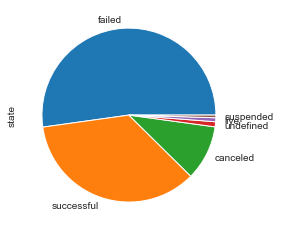

In [39]:
#Campaign state will be the class attribute, so I want to 
#see the distribution of states
import matplotlib.pyplot as plt

states = data['state'].value_counts()
display(states.plot(kind = 'pie'))

In [40]:
#because the vast majority of campaigns either failed or were successful
#I am going to remove records with other outcome states (suspended, live, undefined, canceled)

data = data.drop(data[(data.state != 'successful') & (data.state != 'failed')].index)

### Reviewing summary statistics for each column

In [41]:
#function to output summary stats for numeric attributes
#and unique value counts for object attributes

def sum_stats(data, types):
    for i in range(len(types)):
        
        #do not want to include name, because each name value will be unique
        if types[i] == 'object' and types.index[i] != 'name':
            print('{}: object'.format(types.index[i]))
            print(data[types.index[i]].value_counts())
            print()
        if types[i] == 'int64' or types[i] == 'float64':
            print('{}: numeric'.format(types.index[i]))
            print(data[types.index[i]].describe())
            print()
            
data_types = data.dtypes
sum_stats(data, data_types)

category: object
Product Design     18680
Documentary        14523
Music              12633
Tabletop Games     11744
Shorts             11394
                   ...  
Residencies           68
Letterpress           46
Chiptune              33
Literary Spaces       19
Taxidermy             10
Name: category, Length: 159, dtype: int64

main_category: object
Film & Video    56527
Music           45949
Publishing      35445
Games           28521
Technology      27050
Art             25641
Design          25364
Food            22054
Fashion         19775
Theater         10242
Comics           9878
Photography      9689
Crafts           7818
Journalism       4149
Dance            3573
Name: main_category, dtype: int64

currency: object
USD    261511
GBP     29476
EUR     14378
CAD     12375
AUD      6621
SEK      1510
MXN      1411
NZD      1274
DKK       929
CHF       652
NOK       584
HKD       477
SGD       454
JPY        23
Name: currency, dtype: int64

deadline: object
2014-08-08    612


In [43]:
#writing cleaned data to another file (so I don't need to keep running above code)

outfile = open('clean_kickstarter.csv', 'w')
data.to_csv(outfile)

In [44]:
outfile.close()

In [782]:
import pandas as pd
data = pd.read_csv('clean_kickstarter.csv')
data.pop('Unnamed: 0')
data.pop('deadline')
data.pop('launched')

#some records have an erroneous country value, so I am removing those records
data = data.drop(data[(data.country == 'N,0"')].index)

#descriptive statistics for numeric attributes
data.describe().apply(lambda s: s.apply('{0:.1f}'.format))

,backers,pledged,goal,length,year,percent_goal,avg_contribute
count,331465.0,331465.0,331465.0,331465.0,331465.0,331465.0,331465.0
mean,116.5,9939.9,41523.2,34.0,2014.2,342.3,66.1
std,965.7,96645.2,1109273.7,12.7,1.9,28158.4,131.6
min,0.0,0.0,0.0,1.0,2009.0,0.0,0.0
25%,2.0,50.0,2000.0,30.0,2013.0,1.0,17.0
50%,15.0,787.5,5000.0,30.0,2014.0,20.0,42.0
75%,63.0,4609.0,15000.0,36.0,2016.0,110.0,78.0
max,219382.0,20338986.3,166361390.7,92.0,2017.0,10427789.0,10000.0


* Average campaign length is 34 days
* Average goal is $\$$41,523
* Average pledged is $\$$9,939
* Each campaign has an average of 116 backers
* Average contribution per campaign is $\$$66

## Phase 2: Data Visualizations

In [264]:
#load cleaned data into pandas dataframe

import csv
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

sns.set_style("darkgrid")

#import data into a dataframe and view

data = pd.read_csv('clean_kickstarter.csv')
data.pop('Unnamed: 0')
data.pop('deadline')
data.pop('launched')

#some records have an erroneous country value, so I am removing those records
data = data.drop(data[(data.country == 'N,0"')].index)
data

,name,category,main_category,currency,state,backers,country,pledged,goal,month,length,year,percent_goal,avg_contribute
0,The Songs of Adelaide & Abullah,Poetry,Publishing,GBP,failed,0,GB,0.0,1533.95,Aug,59,2015,0.0,0.0
1,Greeting From Earth: ZGAC Arts Capsule For ET,Narrative Film,Film & Video,USD,failed,15,US,2421.0,30000.00,Sept,60,2017,8.0,161.0
2,Where is Hank?,Narrative Film,Film & Video,USD,failed,3,US,220.0,45000.00,Jan,45,2013,0.0,73.0
3,ToshiCapital Rekordz Needs Help to Complete Album,Music,Music,USD,failed,1,US,1.0,5000.00,Mar,30,2012,0.0,1.0
4,Monarch Espresso Bar,Restaurants,Food,USD,successful,224,US,52375.0,50000.00,Feb,35,2016,105.0,234.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
331670,"Homemade fresh dog food, Cleveland OH",Small Batch,Food,USD,failed,4,US,154.0,6500.00,Mar,30,2017,2.0,38.0
331671,The Tribe,Narrative Film,Film & Video,USD,failed,5,US,155.0,1500.00,Jun,27,2011,10.0,31.0
331672,Walls of Remedy- New lesbian Romantic Comedy f...,Narrative Film,Film & Video,USD,failed,1,US,20.0,15000.00,Jul,46,2010,0.0,20.0
331673,BioDefense Education Kit,Technology,Technology,USD,failed,6,US,200.0,15000.00,Jan,31,2016,1.0,33.0


40% of campaigns were successful
60% of campaigns failed


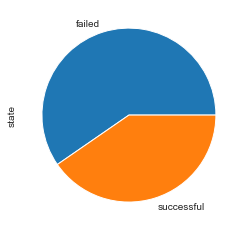

In [265]:
#visualizing counts of the different campaign states
states = data['state'].value_counts()
states.plot(kind='pie')

#calculating percentages of campaign states
failed = data[data.state == 'failed'].shape[0]
successful = data[data.state == 'successful'].shape[0]
p_failed = round((failed / (successful + failed)) * 100)
p_success = round((successful / (successful + failed)) * 100)
print('{}% of campaigns were successful\n{}% of campaigns failed'.format(p_success, p_failed))

* 40% of campaigns were successful
* 60% of campaigns failed

				Campaign Counts


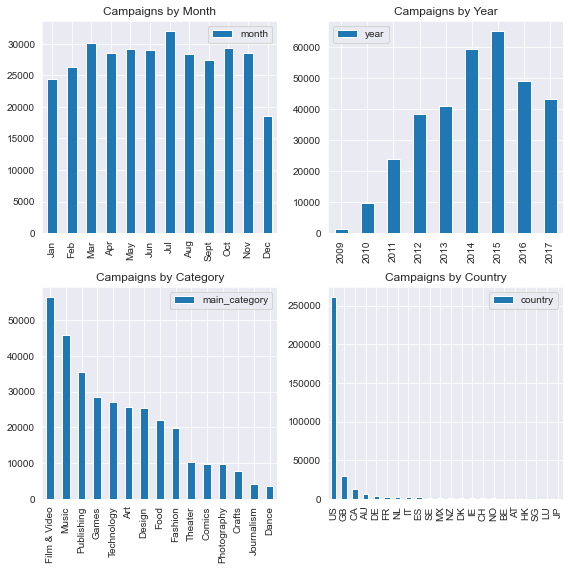

In [266]:
#figure to visualize distributions for relevant categorical attributes

#returns the counts per columns as a dataframe
def view_counts(column):
    if column == 'main_category' or column == 'country':
        holder = data[column].value_counts()
    if column == 'year' or column == 'month':    
        holder = data[column].value_counts(sort = False)
    holder = holder.to_frame()
    if column == 'month':
        holder = holder.reindex(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sept', 'Oct', 'Nov', 'Dec']) 
    index = holder.index
    return holder

cat = view_counts('main_category')
month = view_counts('month')
year = view_counts('year')
country = view_counts('country')

fig, name = plt.subplots(2,2, figsize=(8,8))
cat.plot(ax=name[1, 0], kind = 'bar', title = 'Campaigns by Category')
country.plot(ax=name[1, 1], kind = 'bar', title = 'Campaigns by Country')
month.plot(ax=name[0, 0], kind = 'bar', title ='Campaigns by Month')
year.plot(ax=name[0, 1], kind = 'bar', title = 'Campaigns by Year')
print('\t\t\t\tCampaign Counts')
print('=================='*4)
fig.tight_layout(pad=1.0)

* Film & Video is the most popular campaign category followed by Music and Publishing
* Vast majority of campaigns take place in the US
* Most popular month to host a campaign is in July
* The number of campaigns on kickstarter peaked in 2015 and then fell until 2017

		Numeric Attribute Distributions & Bins


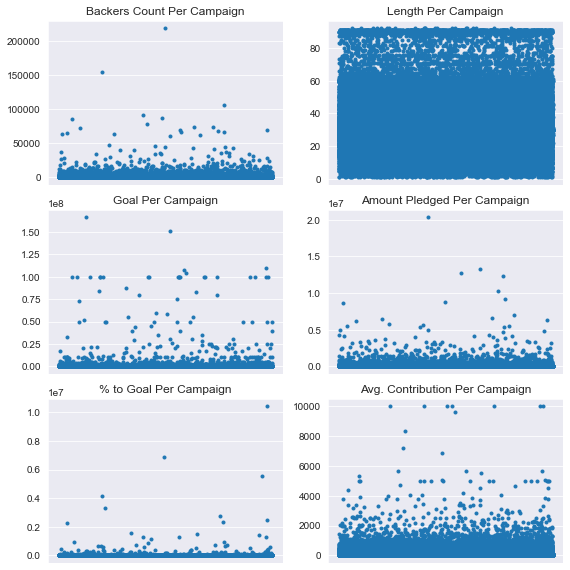

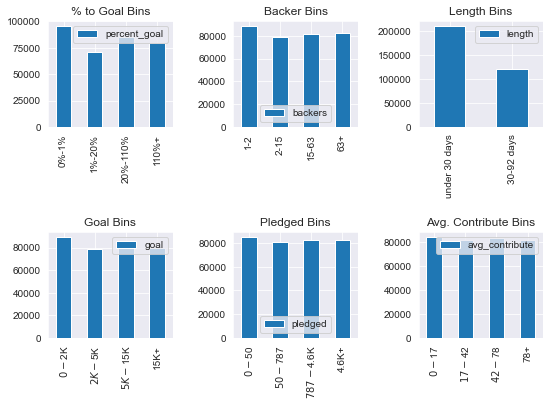

In [267]:
#figure to visualize distributions of relevant numerical attributes

backers = data['backers']
pledged = data['pledged']
goal = data['goal']
length = data['length']
p_goal = data['percent_goal']
avg_contribute = data['avg_contribute']

figure, numeric = plt.subplots(3,2, figsize=(8,8))
backers.plot(ax=numeric[0, 0], style = '.', title = 'Backers Count Per Campaign').set_xticks([])
length.plot(ax=numeric[0, 1], style = '.', title = 'Length Per Campaign').set_xticks([])
goal.plot(ax=numeric[1, 0], style = '.', title = 'Goal Per Campaign').set_xticks([])
pledged.plot(ax=numeric[1, 1], style = '.', title = 'Amount Pledged Per Campaign').set_xticks([])
p_goal.plot(ax=numeric[2, 0], style = '.', title = '% to Goal Per Campaign').set_xticks([])
avg_contribute.plot(ax=numeric[2, 1], style = '.', title = 'Avg. Contribution Per Campaign').set_xticks([])

print('\t\tNumeric Attribute Distributions & Bins')
print('=================='*4)
figure.tight_layout(pad=1.0)

#visualizing numeric attribute bins

backer_bins = pd.qcut(data['backers'],4, labels = ['1-2', '2-15', '15-63', '63+'])
b = backer_bins.value_counts(sort=False).to_frame()

p_goal_bins = pd.qcut(data['percent_goal'],4, labels = ['0%-1%', '1%-20%', '20%-110%', '110%+'])
p = p_goal_bins.value_counts(sort=False).to_frame()

length_bins = pd.qcut(data['length'], 2, labels = ['under 30 days', '30-92 days'])
c = length_bins.value_counts(sort=False).to_frame()

goal_bins = pd.qcut(data['goal'], 4, labels= ['$0-$2K', '$2K-$5K', '$5K-$15K', '15K+'])
g = goal_bins.value_counts(sort=False).to_frame()

pledged_bins = pd.qcut(data['pledged'], 4, labels = ['$0-$50', '$50-$787', '$787-$4.6K', '4.6K+'])
z = pledged_bins.value_counts(sort=False).to_frame()

avgc_bins = pd.qcut(data['avg_contribute'], 4, labels = ['$0-$17', '$17-$42', '$42-$78', '78+'])
k = avgc_bins.value_counts(sort=False).to_frame()


fig3, name = plt.subplots(2,3, figsize=(8,6))
p.plot(ax=name[0, 0], kind = 'bar', title = '% to Goal Bins')
b.plot(ax=name[0, 1], kind = 'bar', title = 'Backer Bins')
c.plot(ax=name[0, 2], kind = 'bar', title = 'Length Bins')
g.plot(ax=name[1, 0], kind = 'bar', title = 'Goal Bins')
z.plot(ax=name[1, 1], kind = 'bar', title = 'Pledged Bins')
k.plot(ax=name[1, 2], kind = 'bar', title = 'Avg. Contribute Bins')


fig3.tight_layout(pad=2.0)


* Vast majority of campaigns were under 30 days in length and the remaining were between 30 and 92 days in length
* The vast majority of campaigns have below 63 backers, but a few outliers
    had many more
* Most campaigns had a goal of under $\$$15K, but a few outliers had much higher goals
* Around half of campaigns raised 20% or less of their goal, while a few outliers far exceeded their goals
* Around half of campaigns raised under $\$$787, a fourth raised between $\$$787 and $\$$4.6K and another fourth raised above $\$$4.6K
* The average size of an individual contribtuon for most campaigns was under $\$$78

				States By Year and Month


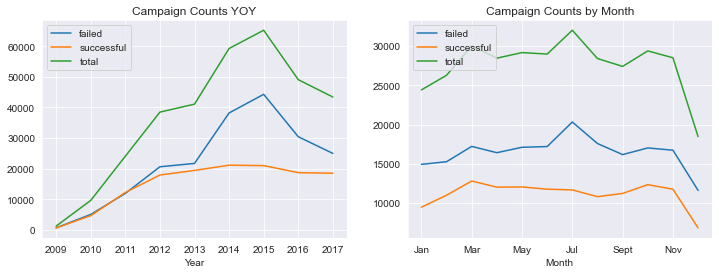

In [268]:
#show YOY states and month vs states

#YOY STATES
#counts the number of failed and successful campaigns per year
def year_counts(a):
    f = data[(data.state == 'failed') & (data.year == a)].shape[0]
    s = data[(data.state == 'successful') & (data.year == a)].shape[0]
    return f, s

#stores year counts into a dict
year_info = {}
for i in range(2009, 2018):
    q = str(i)
    b = year_counts(i)
    year_info[q] = b

#turns dict into a dataframe & renames the columns    
state_year = pd.DataFrame.from_dict(year_info, orient='index')
state_year = state_year.rename(columns={0:'failed',1:'successful'})
state_year = state_year.reset_index()

#adds total campaign count column to dataframe
totals = []
for i in range(len(state_year)):
    f = state_year.loc[i, 'failed']
    s = state_year.loc[i, 'successful']
    total = f + s
    totals.append(total)
state_year['total'] = totals
state_year = state_year.set_index('index')


#MONTH VS STATES
#counts failed and successful campaigns per month
def month_counts(a):
    f = data[(data.state == 'failed') & (data.month == a)].shape[0]
    s = data[(data.state == 'successful') & (data.month == a)].shape[0]
    return f, s

#creates dict to store month counts
month_info = {}
month_info['Jan'] = month_counts('Jan')
month_info['Feb'] = month_counts('Feb')
month_info['Mar'] = month_counts('Mar')
month_info['Apr'] = month_counts('Apr')
month_info['May'] = month_counts('May')
month_info['Jun'] = month_counts('Jun')
month_info['Jul'] = month_counts('Jul')
month_info['Aug'] = month_counts('Aug')
month_info['Sept'] = month_counts('Sept')
month_info['Oct'] = month_counts('Oct')
month_info['Nov'] = month_counts('Nov')
month_info['Dec'] = month_counts('Dec')

#turns dict into a dataframe and changes column names
state_month = pd.DataFrame.from_dict(month_info, orient='index')
state_month = state_month.rename(columns={0:'failed',1:'successful'})
state_month = state_month.reset_index()

#adds a total column to the month dataframe
totals = []
for i in range(len(state_month)):
    f = state_month.loc[i, 'failed']
    s = state_month.loc[i, 'successful']
    total = f + s
    totals.append(total)
state_month['total'] = totals
state_month = state_month.set_index('index')


print('\t\t\t\tStates By Year and Month')
print('=================='*5)

#creates subplot to view campaign state by YOY and by month
fig4, name = plt.subplots(1,2, figsize=(12,4))
state_year.plot(ax=name[0], kind = 'line', title = 'Campaign Counts YOY').set_xlabel('Year')
state_month.plot(ax=name[1], kind = 'line', title = 'Campaign Counts by Month').set_xlabel('Month')

#updates state by year table to include percentages of failed vs successful
state_year = state_year.reset_index()
p_failed = []
p_succeeded = []
for i in range(len(state_year)):
    failed = state_year.loc[i, 'failed']
    succ = state_year.loc[i, 'successful']
    total = failed + succ
    p_f = round((failed/total) * 100)
    p_s = round((succ/total) * 100)
    p_failed.append(p_f)
    p_succeeded.append(p_s)
state_year['%_failed'] = p_failed
state_year['%_success'] = p_succeeded

state_year = state_year.rename(columns={'index':'Year'})


* Up until 2011, failed and successful campaigns were growing at the same rate
* Starting 2013, the rate of failed campaigns grows significantly over successful campaigns
    until 2015, when the rate of failed campaigns trends down closer to the number of
    successful campaigns
* Overall campaign counts on the platform rises until 2015, after which time it starts to drop
* Successful campaigns peak in March 
* There is a peak in campaigns on the platform in July
* Campaigns launched in July have the lowest rate of success, while campaigns launched in March
    have the highest rate of success

Note: See dataframes of above line graphs below for raw numbers and percentages

In [270]:
#dataframes supporting above line graphs

from IPython.core.display import HTML

#below function source: https://github.com/epmoyer/ipy_table/issues/24
def multi_table(table_list):
    ''' Acceps a list of IpyTable objects and returns a table which contains each IpyTable in a cell
    '''
    return HTML(
        '<table><tr style="background-color:white;">' + 
        ''.join(['<td>' + table._repr_html_() + '</td>' for table in table_list]) +
        '</tr></table>'
    )

state_month = state_month.reset_index()

#add percentage of success and fail to the month vs state dataframe
p_suc = []
p_fail = []
for i in range(len(state_month)):
    f = state_month.loc[i, 'failed']
    s = state_month.loc[i, 'successful']
    t = state_month.loc[i, 'total']
    p_s = round((s / t) * 100)
    p_f = round((f / t) * 100)
    p_suc.append(p_s)
    p_fail.append(p_f)

state_month['%_failed'] = p_fail  
state_month['%_success'] = p_suc
#state_month.pop('level_0')
state_month = state_month.rename(columns={'index': 'month'})
multi_table([state_year, state_month])

Orange = Failed Campaigns
Blue= Successful Campaigns


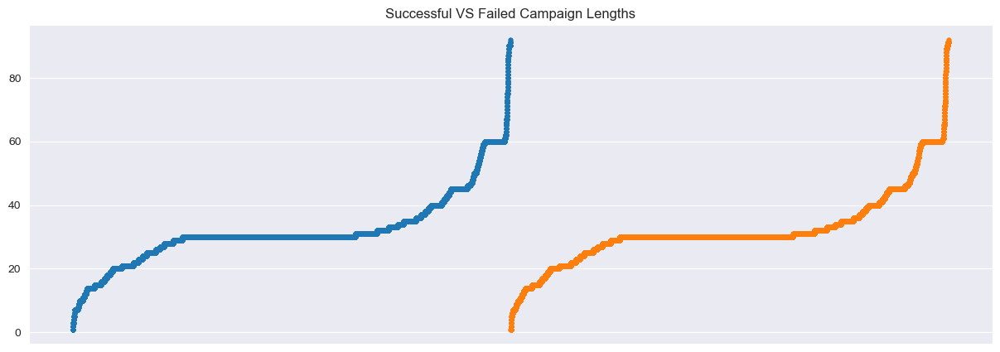

In [769]:
#visualize: length vs state
import matplotlib.pyplot as plt
import seaborn as sns

sns.set_style("darkgrid")

successful = data[data['state'] == 'successful']
successful = successful[['length']].sort_values('length')
failed = data[data['state'] == 'successful']
failed = failed[['length']].sort_values('length')
successful = successful.reset_index()
failed.index = np.arange(len(successful), len(failed)+len(successful))
successful['length'].plot(style= '.', figsize = (15, 5), title = 'Successful VS Failed Campaign Lengths').set_xticks([])
failed['length'].plot(style= '.')

print('Orange = Failed Campaigns\nBlue= Successful Campaigns')


Failed and successful campaigns have nearly identical distributions of lengths

state           
state         failed successful
main_category                  
Art            14131      11510
Comics          4036       5842
Crafts          5703       2115
Dance           1235       2338
Design         14814      10549
Fashion        14181       5593
Film & Video   32892      23612
Food           15969       6085
Games          16003      12518
Journalism      3136       1012
Music          21696      24105
Photography     6384       3305
Publishing     23113      12300
Technology     20613       6433
Theater         3708       6534

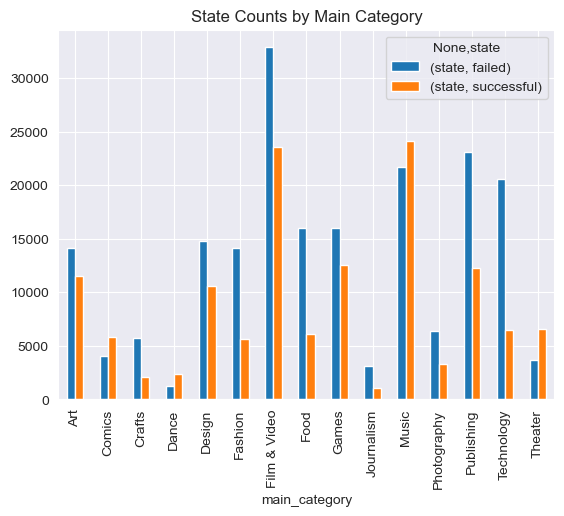

In [780]:
#state vs category

cat_agg = data.groupby('main_category')['state'].value_counts().to_frame().unstack().fillna(0)
cat_agg.plot(kind = 'bar', title = 'State Counts by Main Category')
cat_agg

The main categories with the highest % of successful campaigns are Comics, Music and Theater

In [329]:
#look at correlations

#make version of data where every categorical attribute is mapped to a number
corr_data = data.copy()
corr_data.pop('name')
corr_data.pop('currency')

#function to map categorical values to numbers
def transform(df, column):
    a = df[column].astype("category").cat.codes
    df[column] = a
    return df

corr_data = transform(corr_data, 'category')
corr_data = transform(corr_data, 'main_category')
corr_data = transform(corr_data, 'state')
corr_data = transform(corr_data, 'country')
corr_data = transform(corr_data, 'month')


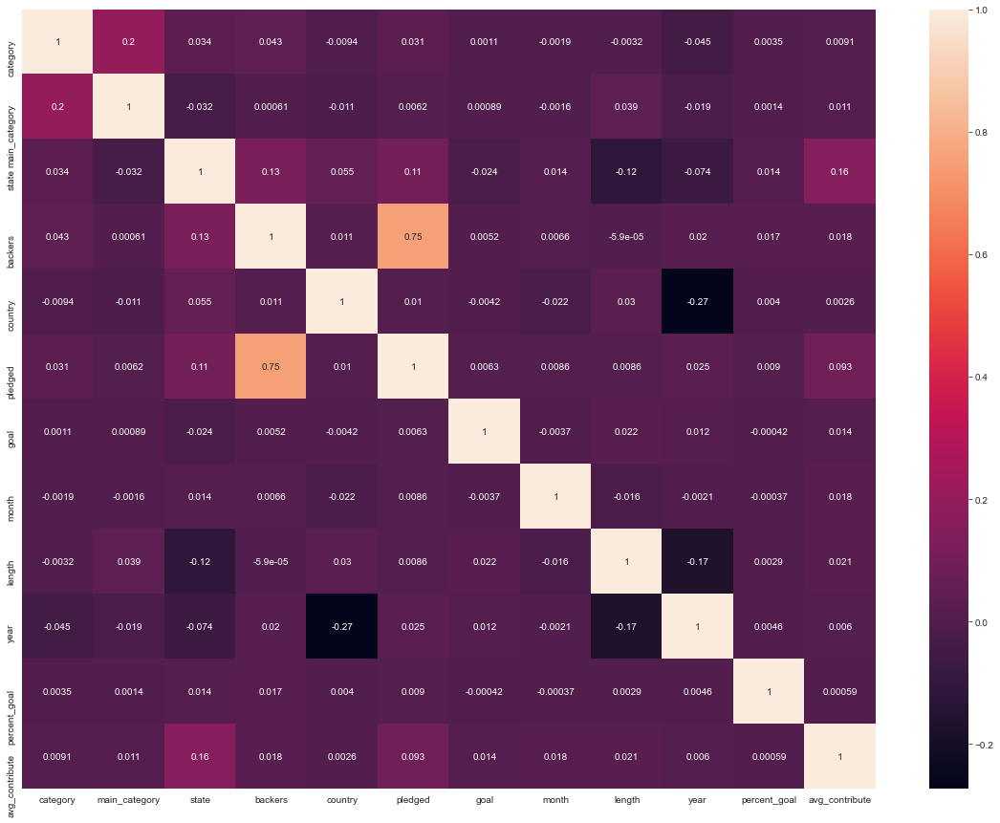

In [336]:
plt.subplots(figsize=(20,15))
sns.heatmap(corr_data.corr(), annot = True)

## Phase 3: Association Rule Mining

### Attempt 1 (No Outliers Removed)

In [275]:
#making data set suitable for apriori 

#make a copy of the dataframe 
ap_data = data.copy()

#remove attributes name, main_category, currency, pledged and % goal(not good for apriori)
ap_data.pop('name')
ap_data.pop('category')
ap_data.pop('currency')
ap_data.pop('pledged')
ap_data.pop('percent_goal')
ap_data

,main_category,state,backers,country,goal,month,length,year,avg_contribute
0,Publishing,failed,0,GB,1533.95,Aug,59,2015,0.0
1,Film & Video,failed,15,US,30000.00,Sept,60,2017,161.0
2,Film & Video,failed,3,US,45000.00,Jan,45,2013,73.0
3,Music,failed,1,US,5000.00,Mar,30,2012,1.0
4,Food,successful,224,US,50000.00,Feb,35,2016,234.0
...,...,...,...,...,...,...,...,...,...
331670,Food,failed,4,US,6500.00,Mar,30,2017,38.0
331671,Film & Video,failed,5,US,1500.00,Jun,27,2011,31.0
331672,Film & Video,failed,1,US,15000.00,Jul,46,2010,20.0
331673,Technology,failed,6,US,15000.00,Jan,31,2016,33.0


In [276]:
#convert years to a string
years = ap_data['year']
years = [str(int) for int in years]
ap_data['year'] = years

#discretize backers
ap_data['backers'] = backer_bins
ap_data['goal'] = goal_bins
ap_data['length'] = length_bins
ap_data['avg_contribute'] = avgc_bins

ap_data

,main_category,state,backers,country,goal,month,length,year,avg_contribute
0,Publishing,failed,1-2,GB,$0-$2K,Aug,30-92 days,2015,$0-$17
1,Film & Video,failed,2-15,US,15K+,Sept,30-92 days,2017,78+
2,Film & Video,failed,2-15,US,15K+,Jan,30-92 days,2013,$42-$78
3,Music,failed,1-2,US,$2K-$5K,Mar,under 30 days,2012,$0-$17
4,Food,successful,63+,US,15K+,Feb,30-92 days,2016,78+
...,...,...,...,...,...,...,...,...,...
331670,Food,failed,2-15,US,$5K-$15K,Mar,under 30 days,2017,$17-$42
331671,Film & Video,failed,2-15,US,$0-$2K,Jun,under 30 days,2011,$17-$42
331672,Film & Video,failed,1-2,US,$5K-$15K,Jul,30-92 days,2010,$17-$42
331673,Technology,failed,2-15,US,$5K-$15K,Jan,30-92 days,2016,$17-$42


In [277]:
import numpy as np
from apyori import apriori
from mlxtend.frequent_patterns import apriori, association_rules 

#turn data into binary variables
ap_data = pd.get_dummies(ap_data)

#running apriori
frq_items = apriori(ap_data, min_support = .05, use_colnames = True)
rules = association_rules(frq_items, metric = 'lift', min_threshold = 1)
rules = rules.sort_values(['confidence', 'lift'], ascending = [False, False])


In [278]:
#filter rules by class association

#convert consequents to string
cons = rules['consequents']
cons = [str(con) for con in cons]
rules['consequents'] = cons

filtered = pd.DataFrame()
for i in range(len(rules)):
    a = str(rules.loc[i, 'consequents'])
    if a == "frozenset({\'state_successful\'})" or a == "frozenset({\'state_failed\'})":
        if rules.loc[i, 'confidence'] >= .70:
            filtered = filtered.append(rules.loc[i])
            
filtered = filtered[['antecedents', 'consequents','confidence', 'antecedent support', 'consequent support', 'support', 'lift', 'leverage']]


In [279]:
#showing only class association rules with confidence >= to .70

filtered= filtered.sort_values(by=['confidence'], ascending=False)
filtered.style

,antecedents,consequents,confidence,antecedent support,consequent support,support,lift,leverage
1000,"frozenset({'goal_15K+', 'backers_1-2', 'country_US'})",frozenset({'state_failed'}),1.000000,0.051496,0.596184,0.051496,1.677336,0.020795
1085,"frozenset({'goal_15K+', 'backers_1-2', 'avg_contribute_$0-$17'})",frozenset({'state_failed'}),1.000000,0.053333,0.596184,0.053333,1.677336,0.021537
284,"frozenset({'goal_15K+', 'backers_1-2'})",frozenset({'state_failed'}),1.000000,0.071706,0.596184,0.071706,1.677336,0.028956
281,"frozenset({'backers_1-2', 'goal_$5K-$15K'})",frozenset({'state_failed'}),0.999900,0.060405,0.596184,0.060399,1.677168,0.024386
277,"frozenset({'backers_1-2', 'goal_$2K-$5K'})",frozenset({'state_failed'}),0.999435,0.058706,0.596184,0.058673,1.676387,0.023673
437,"frozenset({'goal_15K+', 'avg_contribute_$0-$17'})",frozenset({'state_failed'}),0.999144,0.063421,0.596184,0.063367,1.675899,0.025556
335,"frozenset({'goal_15K+', 'backers_2-15'})",frozenset({'state_failed'}),0.999094,0.053264,0.596184,0.053215,1.675816,0.021460
1128,"frozenset({'backers_1-2', 'length_30-92 days', 'avg_contribute_$0-$17'})",frozenset({'state_failed'}),0.998134,0.061427,0.596184,0.061313,1.674205,0.024691
1139,"frozenset({'year_2015', 'backers_1-2', 'avg_contribute_$0-$17'})",frozenset({'state_failed'}),0.997704,0.057810,0.596184,0.057677,1.673484,0.023212
1046,"frozenset({'backers_1-2', 'country_US', 'avg_contribute_$0-$17'})",frozenset({'state_failed'}),0.996955,0.145623,0.596184,0.145180,1.672227,0.058362


### Duscussion of Apriori Results Attempt 1:
Some interesting rules:
* 252 (if your goal is betweem 5K and 15K, and you have b/w 2 and 15 backers, there is 99%+ chance you'll fail
* 1 (if you only have 1-2 backers, there is 99%+ chance you'll fail
* 457 (if over 63 backers and goal of 2K to 5K, 98% chance you'll succeed
* 246 (backers 2-15, goal 2K to 5k, 96% failed)
* 20 campaigns with an average contributiion amount below 17 were 95.4% likely to fail

### Attempt 2: Outliers Removed

* With attributes such as backers, pledged, goal, percent_goal and average contribution, the data
    contains a large amount of outliers which prevents more useful binning (see below box plot)
* In this attempt, I will remove outliers and make larger bins while discretizing with the goal of seeing more nuanced rules

[Text(0.5, 1.0, 'Box Plot for Numeric Data')]

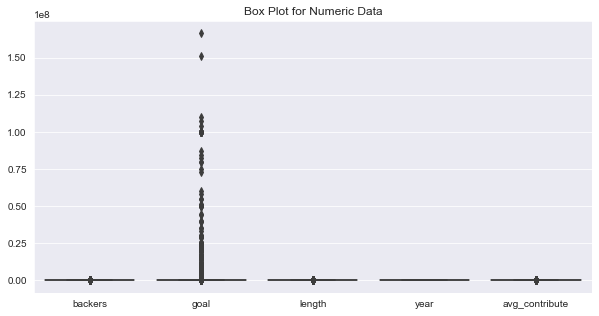

In [288]:
ap_2 = data.copy()
ap_2.pop('name')
ap_2.pop('category')
ap_2.pop('currency')
ap_2.pop('pledged')
ap_2.pop('percent_goal')

plt.subplots(figsize=(10,5))
sns.boxplot(data = ap_2).set(title= 'Box Plot for Numeric Data')

In [289]:
ap_2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 331465 entries, 0 to 331674
Data columns (total 9 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   main_category   331465 non-null  object 
 1   state           331465 non-null  object 
 2   backers         331465 non-null  int64  
 3   country         331465 non-null  object 
 4   goal            331465 non-null  float64
 5   month           331465 non-null  object 
 6   length          331465 non-null  int64  
 7   year            331465 non-null  int64  
 8   avg_contribute  331465 non-null  float64
dtypes: float64(2), int64(3), object(4)
memory usage: 25.3+ MB


In [290]:
#function to find and remove outliers
def remoutlier(df, column):
    """Function that takes as input a dataframe and a column name of a numeric attribute
    and returns the df with outlier rows removed (outliers as defined by being more than 3 * the SD
    away from the mean)"""
    sd = df[column].std()
    mean = df[column].mean()
    cutoff = sd * 3
    upper = mean + cutoff
    lower = mean - cutoff
    b = df.loc[(df[column] < upper) & (df[column] > lower)]
    return b

#function to find outliers, for if we want to look at and analyze these later
def findoutlier(df, column):
    """Function that takes as input a dataframe and a column name of a numeric attribute
    and returns a df with outlier values that are above the mean (outliers as defined by 
    being more than 3 * the SD away from the mean)"""
    sd = df[column].std()
    mean = df[column].mean()
    cutoff = sd * 3
    upper = mean + cutoff
    b = df.loc[df[column] > upper]
    return b

a = remoutlier(ap_2, 'goal')
a = remoutlier(a, 'backers')
a = remoutlier(a, 'length')
a = remoutlier(a, 'avg_contribute')
ap_2 = a

#look at descriptive statistics for new data with outliers removed
descriptive = ap_2.copy()
descriptive.describe().apply(lambda s: s.apply('{0:.5f}'.format))

,backers,goal,length,year,avg_contribute
count,323337.00000,323337.00000,323337.00000,323337.00000,323337.00000
mean,80.55687,20961.69235,33.42490,2014.20675,57.68092
std,225.61185,93008.57232,11.66935,1.90307,63.11896
min,0.00000,0.01000,1.00000,2009.00000,0.00000
25%,2.00000,2000.00000,30.00000,2013.00000,16.00000
50%,15.00000,5000.00000,30.00000,2014.00000,42.00000
75%,62.00000,15000.00000,35.00000,2016.00000,76.00000
max,3015.00000,3361627.03000,72.00000,2017.00000,459.00000


* Average campaign length is 33 days 
* Average goal is $\$$20,961
* Each campaign has an average of 80 backers
* Average contribution per campaign is $\$$57.68

In [291]:
def discretize(df, column):
    if column == 'length':
        a = pd.qcut(df[column], 3, precision = 0)
        df[column] = a
        return df
    a = pd.qcut(df[column], 8, precision = 0)
    df[column] = a
    return df

ap_2 = discretize (ap_2, 'backers')
ap_2 = discretize (ap_2, 'goal')
ap_2 = discretize (ap_2, 'avg_contribute')
ap_2 = discretize (ap_2, 'length')

In [292]:
ap_2

,main_category,state,backers,country,goal,month,length,year,avg_contribute
0,Publishing,failed,"(-1.0, 1.0]",GB,"(850.0, 2000.0]",Aug,"(31.0, 72.0]",2015,"(-1.0, 1.0]"
1,Film & Video,failed,"(6.0, 15.0]",US,"(15000.0, 30000.0]",Sept,"(31.0, 72.0]",2017,"(115.0, 459.0]"
2,Film & Video,failed,"(2.0, 6.0]",US,"(30000.0, 3361627.0]",Jan,"(31.0, 72.0]",2013,"(56.0, 76.0]"
3,Music,failed,"(-1.0, 1.0]",US,"(3347.0, 5000.0]",Mar,"(0.0, 30.0]",2012,"(-1.0, 1.0]"
4,Food,successful,"(141.0, 3015.0]",US,"(30000.0, 3361627.0]",Feb,"(31.0, 72.0]",2016,"(115.0, 459.0]"
...,...,...,...,...,...,...,...,...,...
331670,Food,failed,"(2.0, 6.0]",US,"(5000.0, 9000.0]",Mar,"(0.0, 30.0]",2017,"(29.0, 42.0]"
331671,Film & Video,failed,"(2.0, 6.0]",US,"(850.0, 2000.0]",Jun,"(0.0, 30.0]",2011,"(29.0, 42.0]"
331672,Film & Video,failed,"(-1.0, 1.0]",US,"(9000.0, 15000.0]",Jul,"(31.0, 72.0]",2010,"(16.0, 29.0]"
331673,Technology,failed,"(2.0, 6.0]",US,"(9000.0, 15000.0]",Jan,"(30.0, 31.0]",2016,"(29.0, 42.0]"


In [293]:
#convert years to a string
years = ap_2['year']
years = [str(int) for int in years]
ap_2['year'] = years

#turn data into binary variables
ap_2 = pd.get_dummies(ap_2)

#running apriori
frq_items = apriori(ap_2, min_support = .03, use_colnames = True)
rules = association_rules(frq_items, metric = 'lift', min_threshold = 1)
rules = rules.sort_values(['confidence', 'lift'], ascending = [False, False])

In [294]:
#filter rules by class association

#convert consequents to string
cons = rules['consequents']
cons = [str(con) for con in cons]
rules['consequents'] = cons

filtered = pd.DataFrame()
for i in range(len(rules)):
    a = str(rules.loc[i, 'consequents'])
    if a == "frozenset({\'state_successful\'})" or a == "frozenset({\'state_failed\'})":
        if rules.loc[i, 'confidence'] >= .70:
            filtered = filtered.append(rules.loc[i])
            
filtered = filtered[['antecedents', 'consequents','confidence', 'antecedent support', 
                     'consequent support', 'support', 'lift', 'leverage']]

In [248]:
#showing only class association rules with confidence >= to .70

filtered= filtered.sort_values(by=['confidence'], ascending=False)
filtered.style

,antecedents,consequents,confidence,antecedent support,consequent support,support,lift,leverage
553,"frozenset({'length_(0.0, 30.0]', 'backers_(-1.0, 1.0]', 'avg_contribute_(-1.0, 1.0]'})",frozenset({'state_failed'}),0.999568,0.097772,0.596184,0.097730,1.676611,0.039440
192,"frozenset({'backers_(-1.0, 1.0]', 'avg_contribute_(-1.0, 1.0]'})",frozenset({'state_failed'}),0.999508,0.141164,0.596184,0.141095,1.676511,0.056935
643,"frozenset({'backers_(-1.0, 1.0]', 'length_(0.0, 30.0]', 'country_US', 'avg_contribute_(-1.0, 1.0]'})",frozenset({'state_failed'}),0.999454,0.071821,0.596184,0.071781,1.676420,0.028963
539,"frozenset({'backers_(-1.0, 1.0]', 'country_US', 'avg_contribute_(-1.0, 1.0]'})",frozenset({'state_failed'}),0.999428,0.105510,0.596184,0.105450,1.676376,0.042546
257,"frozenset({'country_US', 'avg_contribute_(-1.0, 1.0]'})",frozenset({'state_failed'}),0.999023,0.111122,0.596184,0.111013,1.675696,0.044764
596,"frozenset({'length_(0.0, 30.0]', 'country_US', 'avg_contribute_(-1.0, 1.0]'})",frozenset({'state_failed'}),0.998884,0.075667,0.596184,0.075583,1.675463,0.030471
27,"frozenset({'avg_contribute_(-1.0, 1.0]'})",frozenset({'state_failed'}),0.998622,0.148927,0.596184,0.148722,1.675025,0.059934
304,"frozenset({'length_(0.0, 30.0]', 'avg_contribute_(-1.0, 1.0]'})",frozenset({'state_failed'}),0.998566,0.103067,0.596184,0.102919,1.674930,0.041472
181,"frozenset({'backers_(-1.0, 1.0]', 'length_(31.0, 92.0]'})",frozenset({'state_failed'}),0.997242,0.061246,0.596184,0.061077,1.672709,0.024563
184,"frozenset({'year_2015', 'backers_(-1.0, 1.0]'})",frozenset({'state_failed'}),0.996010,0.060492,0.596184,0.060251,1.670643,0.024186


### Duscussion of Apriori Results Attempt 2:
Some interesting rules:
* 86% confidence that campaigns in the US with at least 63 backers will succeed 
* 82% confidence that campaigns anywhere with at least 63 backers will succeed 
* 82% confidence that campaigns with a gaol above 30,000 will fail
* 71% confidence that campaigns anywhere with between 32 and 63 backers will succeed 

## Phase 4: Classification Model

The purpose of the classification model is to better predict new campaign instances, so I am removing the following 
attributes:
* name (not relevant for classification model)
* currency (redundant information because country attribute gives the same info)
* pledged (we won't know the pledged amount for a new campaign record)
* year (not relevant for new campaign instances)
* percent_goal (not relevant for new campaign instances)
* avg_contribute (not relevant for new campaign instances)

### Attempt 1: No outliers removed, backers removed 

In [648]:
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier 
from sklearn.model_selection import train_test_split 
from sklearn import metrics
from sklearn import tree

#copy data and remove irrelevant attributes
class_data = data.copy()
class_data.pop('name')
class_data.pop('currency')
class_data.pop('pledged')
class_data.pop('year')
class_data.pop('percent_goal')
class_data.pop('avg_contribute')
class_data.pop('backers')

#encode categorical attributes
dataEncoded = pd.get_dummies(class_data, columns = ['category', 'main_category','country','month'])

#divide class attribute from rest
x = dataEncoded.drop(['state'], axis = 1)
y = dataEncoded['state']

#create test and training splits
x_train, x_test, y_train, y_test = train_test_split(x, y, train_size=0.7, test_size=0.3)

In [649]:
dataEncoded

,state,goal,length,category_3D Printing,category_Academic,category_Accessories,category_Action,category_Animals,category_Animation,category_Anthologies,...,month_Dec,month_Feb,month_Jan,month_Jul,month_Jun,month_Mar,month_May,month_Nov,month_Oct,month_Sept
0,failed,1533.95,59,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,failed,30000.00,60,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
2,failed,45000.00,45,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
3,failed,5000.00,30,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
4,successful,50000.00,35,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
331670,failed,6500.00,30,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
331671,failed,1500.00,27,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
331672,failed,15000.00,46,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
331673,failed,15000.00,31,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0


In [650]:
from sklearn import tree

#Fit tree
myTree = tree.DecisionTreeClassifier(max_depth=7)
myTree = myTree.fit(x_train, y_train)

#Test model
predictions = myTree.predict(x_test)

from sklearn.metrics import accuracy_score

print('Accuracy on test data is %.2f' % (accuracy_score(y_test, predictions)))

print(metrics.confusion_matrix(y_test, predictions))
print(metrics.classification_report(y_test, predictions))

#Note, I played around with the max depth of the tree, and the highest accuracy result was acheived 
#with a max depth of 7

Accuracy on test data is 0.66
[[49055 10204]
 [23910 16271]]
              precision    recall  f1-score   support

      failed       0.67      0.83      0.74     59259
  successful       0.61      0.40      0.49     40181

    accuracy                           0.66     99440
   macro avg       0.64      0.62      0.62     99440
weighted avg       0.65      0.66      0.64     99440



In [633]:
#plot tree

#reset sns defaults so arrows show up in tree
sns.reset_defaults()

fig = plt.figure(figsize = (65, 35), dpi= 600, edgecolor = 'k')
p = tree.plot_tree(myTree, feature_names = x.columns,
                  class_names = y.unique(), filled = True, fontsize = 25,
                  max_depth = 4, rounded = True)

In [634]:
#show text representation of tree
text_representation = tree.export_text(myTree, feature_names = list(x.columns))
print(text_representation)

|--- goal <= 15000.08
|   |--- goal <= 4013.26
|   |   |--- length <= 29.50
|   |   |   |--- category_Tabletop Games <= 0.50
|   |   |   |   |--- main_category_Theater <= 0.50
|   |   |   |   |   |--- main_category_Fashion <= 0.50
|   |   |   |   |   |   |--- main_category_Comics <= 0.50
|   |   |   |   |   |   |   |--- class: successful
|   |   |   |   |   |   |--- main_category_Comics >  0.50
|   |   |   |   |   |   |   |--- class: successful
|   |   |   |   |   |--- main_category_Fashion >  0.50
|   |   |   |   |   |   |--- goal <= 927.39
|   |   |   |   |   |   |   |--- class: failed
|   |   |   |   |   |   |--- goal >  927.39
|   |   |   |   |   |   |   |--- class: failed
|   |   |   |   |--- main_category_Theater >  0.50
|   |   |   |   |   |--- goal <= 2936.97
|   |   |   |   |   |   |--- category_Festivals <= 0.50
|   |   |   |   |   |   |   |--- class: successful
|   |   |   |   |   |   |--- category_Festivals >  0.50
|   |   |   |   |   |   |   |--- class: successful
|   |   

In [651]:
#create dataframe to store attempt results 

column = ['attempt', 'accuracy','backer_data_used?', 'removed_outliers?', 'removed_top_goals?']
results = pd.DataFrame(columns = column)

a = round(accuracy_score(y_test, predictions), 2)
results = results.append({'attempt': 'attempt 1', 'accuracy': a, 
                'removed_outliers?': 'No', 'removed_top_goals?': 'No', 'backer_data_used?': 'No' }, 
               ignore_index=True)


### Attempt 2: Outliers removed, backers removed

In [652]:
#copy data and remove irrelevant attributes
class_data = data.copy()
class_data.pop('name')
class_data.pop('currency')
class_data.pop('pledged')
class_data.pop('year')
class_data.pop('percent_goal')
class_data.pop('avg_contribute')
class_data.pop('backers')

#remove outlier data for goal and length
class_data = remoutlier(class_data, 'goal')
class_data = remoutlier(class_data, 'length')

#encode categorical attributes
dataEncoded = pd.get_dummies(class_data, columns = ['category', 'main_category','country','month'])

#divide class attribute from rest
x = dataEncoded.drop(['state'], axis = 1)
y = dataEncoded['state']

#create test and training splits
x_train, x_test, y_train, y_test = train_test_split(x, y, train_size=0.7, test_size=0.3)

#Fit tree
myTree = tree.DecisionTreeClassifier(max_depth = 12)
myTree = myTree.fit(x_train, y_train)

#Test model
predictions = myTree.predict(x_test)

print('Accuracy on test data is %.2f' % (accuracy_score(y_test, predictions)))

print(metrics.confusion_matrix(y_test, predictions))
print(metrics.classification_report(y_test, predictions))

# I tested multiple different max depths and optimal accuracy is achieved with a max depth of 12

b = round(accuracy_score(y_test, predictions), 2)
results = results.append({'attempt': 'attempt 2', 'accuracy': b, 
                'removed_outliers?': 'Yes', 'removed_top_goals?': 'No', 'backer_data_used?': 'No' }, 
               ignore_index=True)

Accuracy on test data is 0.67
[[49164  9598]
 [23218 16455]]
              precision    recall  f1-score   support

      failed       0.68      0.84      0.75     58762
  successful       0.63      0.41      0.50     39673

    accuracy                           0.67     98435
   macro avg       0.66      0.63      0.63     98435
weighted avg       0.66      0.67      0.65     98435



### Attempt 3: Outliers removed, backers removed, records in the top 8th of goal amount removed

* See below for distribution of goal amounts

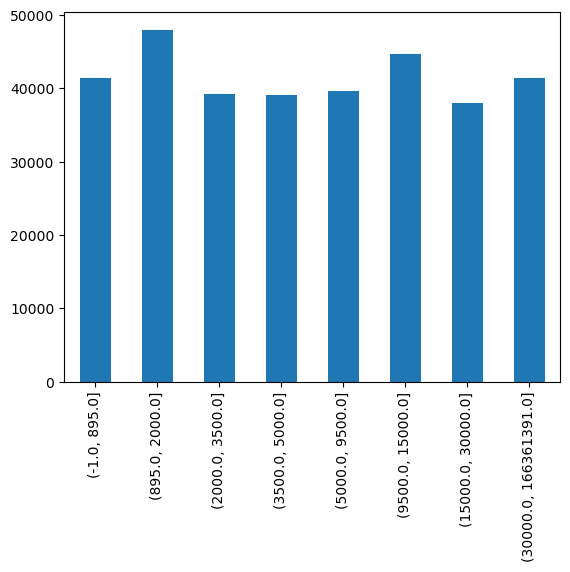

In [524]:
a = pd.qcut(data['goal'], 8, precision = 0).value_counts(sort = False)
a.plot(kind = 'bar')


In [654]:
#copy data and remove irrelevant attributes
class_data = data.copy()
class_data.pop('name')
class_data.pop('currency')
class_data.pop('pledged')
class_data.pop('year')
class_data.pop('percent_goal')
class_data.pop('avg_contribute')
class_data.pop('backers')

#remove outlier data for goal and length
class_data = remoutlier(class_data, 'goal')
class_data = remoutlier(class_data, 'length')

#remove records with goal amounts in the top 8th
class_data = class_data[class_data['goal'] < 30000]

#encode categorical attributes
dataEncoded = pd.get_dummies(class_data, columns = ['category', 'main_category','country','month'])

#divide class attribute from rest
x = dataEncoded.drop(['state'], axis = 1)
y = dataEncoded['state']

#create test and training splits
x_train, x_test, y_train, y_test = train_test_split(x, y, train_size=0.7, test_size=0.3)

#Fit tree
myTree = tree.DecisionTreeClassifier(max_depth = 13)
myTree = myTree.fit(x_train, y_train)

#Test model
predictions = myTree.predict(x_test)

c = round(accuracy_score(y_test, predictions), 2)
results = results.append({'attempt': 'attempt 3', 'accuracy': c, 
                'removed_outliers?': 'Yes', 'removed_top_goals?': 'Yes', 'backer_data_used?': 'No' }, 
               ignore_index=True)

print('Accuracy on test data is %.2f' % (accuracy_score(y_test, predictions)))

print(metrics.confusion_matrix(y_test, predictions))
print(metrics.classification_report(y_test, predictions))

# I tested multiple different max depths and optimal accuracy is achieved with a max depth of 13

Accuracy on test data is 0.65
[[36790 10588]
 [19081 18197]]
              precision    recall  f1-score   support

      failed       0.66      0.78      0.71     47378
  successful       0.63      0.49      0.55     37278

    accuracy                           0.65     84656
   macro avg       0.65      0.63      0.63     84656
weighted avg       0.65      0.65      0.64     84656



### Attempt 4: No outliers removed, backer attribute used in model

In [676]:
#copy data and remove irrelevant attributes
class_data = data.copy()
class_data.pop('name')
class_data.pop('currency')
class_data.pop('pledged')
class_data.pop('year')
class_data.pop('percent_goal')
class_data.pop('avg_contribute')

#encode categorical attributes
dataEncoded = pd.get_dummies(class_data, columns = ['category', 'main_category','country','month'])


#divide class attribute from rest
x = dataEncoded.drop(['state'], axis = 1)
y = dataEncoded['state']

#create test and training splits
x_train, x_test, y_train, y_test = train_test_split(x, y, train_size=0.7, test_size=0.3)

#Fit tree
myTree4 = tree.DecisionTreeClassifier(max_depth = 7)
myTree4 = myTree4.fit(x_train, y_train)

#Test model
predictions = myTree.predict(x_test)

#d = round(accuracy_score(y_test, predictions), 2)
#results = results.append({'attempt': 'attempt 4', 'accuracy': d, 
                #'removed_outliers?': 'No', 'removed_top_goals?': 'No', 'backer_data_used?': 'Yes' }, 
               #ignore_index=True)

print('Accuracy on test data is %.2f' % (accuracy_score(y_test, predictions)))

print(metrics.confusion_matrix(y_test, predictions))
print(metrics.classification_report(y_test, predictions))

# I tested multiple different max depths and optimal accuracy is achieved with a max depth of 7

Accuracy on test data is 0.93
[[55192  4183]
 [ 2797 37268]]
              precision    recall  f1-score   support

      failed       0.95      0.93      0.94     59375
  successful       0.90      0.93      0.91     40065

    accuracy                           0.93     99440
   macro avg       0.93      0.93      0.93     99440
weighted avg       0.93      0.93      0.93     99440



### Attempt 5: Outliers removed, backer attribute used in model

In [675]:
#copy data and remove irrelevant attributes
class_data = data.copy()
class_data.pop('name')
class_data.pop('currency')
class_data.pop('pledged')
class_data.pop('year')
class_data.pop('percent_goal')
class_data.pop('avg_contribute')

#remove outlier data for goal and length
class_data = remoutlier(class_data, 'goal')
class_data = remoutlier(class_data, 'length')

#encode categorical attributes
dataEncoded = pd.get_dummies(class_data, columns = ['category', 'main_category','country','month'])

#divide class attribute from rest
x = dataEncoded.drop(['state'], axis = 1)
y = dataEncoded['state']

#create test and training splits
x_train, x_test, y_train, y_test = train_test_split(x, y, train_size=0.7, test_size=0.3)

#Fit tree
myTree = tree.DecisionTreeClassifier(max_depth = 8)
myTree = myTree.fit(x_train, y_train)

#Test model
predictions = myTree.predict(x_test)

e = round(accuracy_score(y_test, predictions), 2)
results = results.append({'attempt': 'attempt 5', 'accuracy': e, 
                'removed_outliers?': 'Yes', 'removed_top_goals?': 'No', 'backer_data_used?': 'Yes' }, 
               ignore_index=True)

print('Accuracy on test data is %.2f' % (accuracy_score(y_test, predictions)))

print(metrics.confusion_matrix(y_test, predictions))
print(metrics.classification_report(y_test, predictions))

# I tested multiple different max depths and optimal accuracy is achieved with a max depth of 8

Accuracy on test data is 0.93
[[54502  4211]
 [ 2796 36926]]
              precision    recall  f1-score   support

      failed       0.95      0.93      0.94     58713
  successful       0.90      0.93      0.91     39722

    accuracy                           0.93     98435
   macro avg       0.92      0.93      0.93     98435
weighted avg       0.93      0.93      0.93     98435



### Attempt 6: Outliers removed, backers attribute used in model, records in the top 8th of goal amount removed

In [657]:
#copy data and remove irrelevant attributes
class_data = data.copy()
class_data.pop('name')
class_data.pop('currency')
class_data.pop('pledged')
class_data.pop('year')
class_data.pop('percent_goal')
class_data.pop('avg_contribute')

#remove outlier data for goal and length
class_data = remoutlier(class_data, 'goal')
class_data = remoutlier(class_data, 'length')

#remove records with goal amounts in the top 8th
class_data = class_data[class_data['goal'] < 30000]

#encode categorical attributes
dataEncoded = pd.get_dummies(class_data, columns = ['category', 'main_category','country','month'])

#divide class attribute from rest
x = dataEncoded.drop(['state'], axis = 1)
y = dataEncoded['state']

#create test and training splits
x_train, x_test, y_train, y_test = train_test_split(x, y, train_size=0.7, test_size=0.3)

#Fit tree
myTree = tree.DecisionTreeClassifier(max_depth = 5)
myTree = myTree.fit(x_train, y_train)

#Test model
predictions = myTree.predict(x_test)

f = round(accuracy_score(y_test, predictions), 2)
results = results.append({'attempt': 'attempt 6', 'accuracy': f, 
                'removed_outliers?': 'Yes', 'removed_top_goals?': 'Yes', 'backer_data_used?': 'Yes' }, 
               ignore_index=True)

print('Accuracy on test data is %.2f' % (accuracy_score(y_test, predictions)))

print(metrics.confusion_matrix(y_test, predictions))
print(metrics.classification_report(y_test, predictions))

# I tested multiple different max depths and optimal accuracy is achieved with a max depth of 5

Accuracy on test data is 0.92
[[43746  3559]
 [ 3270 34081]]
              precision    recall  f1-score   support

      failed       0.93      0.92      0.93     47305
  successful       0.91      0.91      0.91     37351

    accuracy                           0.92     84656
   macro avg       0.92      0.92      0.92     84656
weighted avg       0.92      0.92      0.92     84656



In [670]:
results
results.set_index('attempt')

,accuracy,backer_data_used?,removed_outliers?,removed_top_goals?
attempt,,,,
attempt 1,0.66,No,No,No
attempt 2,0.67,No,Yes,No
attempt 3,0.65,No,Yes,Yes
attempt 4,0.93,Yes,No,No
attempt 5,0.93,Yes,Yes,No
attempt 6,0.92,Yes,Yes,Yes


## Phase 5: Predicting New Campaign Instances

* The below application uses the classification model to predict a newly created campaign outcome
    for new campaign instances
* Based on the accuracy numbers for the above models, I am going to used the 
    model from attempt 4 in my below application
* Since we won't know the number of backers at the time a campaign is created, we will use average number of backers
    based on other campaign details given to fill in the backer attribute for the prediction

In [781]:
import time

#function that takes the users campaign details as input, inserts a predicted number of backers based on 
#other campaigns with same category and main category and ouputs a predicted campaign outcome
def predictCampaign(choices):
    holder = class_data.copy()
    
    #insert backer value based on average for other campaigns in the same category and main_category
    a = holder.query('category == "{}" & main_category == "{}"'.format(choices[0], choices[1]))
    #remove outliers 2x so averages are more realistic
    a = remoutlier(a, 'backers')
    a = remoutlier(a, 'backers')
    av = a['backers'].mean()
    holder = holder.append({'category': choices[0], 'main_category': choices[1], 'state':'NA', 'backers': av,
                     'country': choices[2], 'goal': choices[3], 'month':choices[4], 'length' : choices[5]}, ignore_index=True)

    #encode choices
    dataEncoded = pd.get_dummies(holder, columns = ['category', 'main_category','country','month'])
    dataEncoded = dataEncoded.drop(['state'], axis = 1)
    
    #isolate encoded choices list
    h = dataEncoded[-1:]
    
    #make prediction
    prediction = myTree4.predict(h)
    return prediction 

print('\t\t🚀 Kickstarter Campaign Helper')
print('================================' *2)

time.sleep(1)

print('*Here\'s how it works:*')
print()
print('''We\'ll ask you some questions about your campaign. Then, based on 
our data of nearly 300K previous campaigns we\'ll make a prediction about
the outcome of your campaign!''')

print()
time.sleep(4)
print('Let\'s get started!')

for i in range(8):
    print('.', end= '')
    time.sleep(.3)

#list to store user input
choices = []

#get category
k = 0
while k == 0:
    category = input('Please enter your category: ')
    if category not in data['category'].unique():
        print('Hmmm, that is not one of the categories offered for Kickstarter campaigns. Let\'s try that again.')
        time.sleep(2)
        continue
    else: 
        choices.append(category)
        k = 1


#give some details about the campaign type 
number = data[data['category']==category].shape[0]
print()
print('Nice! You\'re standing on the shoulders of giants! {} campaigns before you have launched in the {} category.'.format(number, category))
print()

#get main category
k = 0
while k == 0:
    main_category = input('Enter your main category: ')
    if main_category not in data['main_category'].unique():
        print('Hmmm, that is not one of the main categories offered for Kickstarter campaigns. Let\'s try that again.')
        time.sleep(2)
        continue
    else: 
        choices.append(main_category)
        k = 1
        

#give some details about the main_campaign type 
number = data[data['main_category']==main_category].shape[0]
print()
print('Great minds think alike! Kickstarter has had {} campaigns in {} already.'.format(number, main_category))
print()

#get country
k = 0
while k == 0:
    country = input('Enter your capitalized, 2-letter country code: ')
    if country not in data['country'].unique():
        print('Hmmm, Kickstarter does not support campaigns in this location. Let\'s try that again.')
        time.sleep(2)
        continue
    else: 
        choices.append(country)
        k = 1

#give some details about the country 
print()
if country == 'US':
    print('Great! Most Kickstarter campaigns also launch in the US!')
else:
    number = round(((data[data['country']==country].shape[0]) / len(data)) * 100)
    if number >= 1:
        print('You\'re a pioneer! Only {}% of Kickstarter campaigns have launched in your country, which means there\'s lots of opportunity for your campaign to gain traction!'.format(number))
    if number < 1:
        print('You\'re a pioneer! Less than 1% of Kickstarter campaigns have launched in your country, which means there\'s lots of opportunity for your campaign to gain traction!')

#get goal
print()
k = 0
while k == 0:
    goal = eval(input('What is your goal amount to raise?: '))
    if goal <= 0:
        print('Oops! You need to enter an amount above zero. Let\'s try that again.')
        time.sleep(2)
        continue
    else: 
        choices.append(goal)
        print('Great! Thanks for sharing.')
        k = 1
        
#get month
print()
k = 0
while k == 0:
    month = input('During which month do you plan to launch your campaign?: ')
    if month not in data['month'].unique():
        print('Hmmm, try typing in the first three letters of the month. Let\'s try that again.')
        time.sleep(2)
        continue
    else: 
        choices.append(month)
        print('We got it.')
        k = 1
        
#get length
print()
k = 0
while k == 0:
    length = eval(input('How many days to you plan for your campaign to last?: '))
    if length <= 0:
        print('Oops! You need to enter an amount above zero. Let\'s try that again.')
        time.sleep(2)
        continue
    else: 
        choices.append(length)
        print('Noted.')
        k = 1
        
time.sleep(2)

print()
hold = predictCampaign(choices)
if hold == 'successful':
    print('Our data tells us your campaign is likely to succeed!')
if hold == 'failed':
    print('Our data tells us your campaign is likely to fail.')


		🚀 Kickstarter Campaign Helper
*Here's how it works:*

We'll ask you some questions about your campaign. Then, based on 
our data of nearly 300K previous campaigns we'll make a prediction about
the outcome of your campaign!

Let's get started!
........Please enter your category: Technology

Nice! You're standing on the shoulders of giants! 5723 campaigns before you have launched in the Technology category.

Enter your main category: Technology

Great minds think alike! Kickstarter has had 27046 campaigns in Technology already.

Enter your capitalized, 2-letter country code: GB

You're a pioneer! Only 9% of Kickstarter campaigns have launched in your country, which means there's lots of opportunity for your campaign to gain traction!

What is your goal amount to raise?: 4000
Great! Thanks for sharing.

During which month do you plan to launch your campaign?: Aug
We got it.

How many days to you plan for your campaign to last?: 40
Noted.
Our data tells us your campaign is likely to succ

## Phase 6: Duscussion

* Possible applications of project:
    * If Kickstarter wants to identify and offer help to new campaigns that the model deems at risk of failing
    * If Kickstarter wants to offer helpful tips to any campaign based on their data

* Future work could include:
    * Data on campaign marketing (what channels, how much plan to be spent) as it would be interesting to see how this interacts with outcome
    * Data on whether backers were in network of founders or strangers
    * Data on page views, conversion
    * Data on time dispersion of backers (what it means if you get lots of backers early on)
    * Classification of quality of campaign page (how does campaign page appear?)
